## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

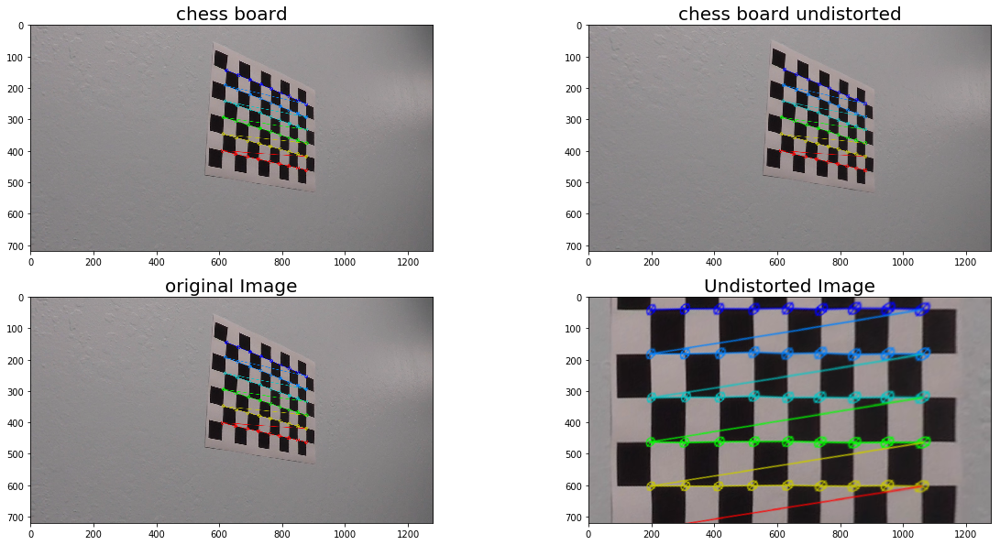

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import os

#%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
rets = []
mtxs = []
dists = []
rvecss = []
tvecss = []


def corners_unwarp(img, nx, ny, mtx, dist):
    # Undistort using mtx and dist
    img = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret == True:
        # a) draw corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
        src = np.float32([corners[0],corners[7],corners[40],corners[47]])
        # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        dst = np.float32([[200,160],[1050,160],[200,740],[1050,740]])
        # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # d2) unwarp matrix
        Minv = cv2.getPerspectiveTransform(dst, src)
        # e) use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
        return warped, M, Minv

# Make a list of calibration images
images = glob.glob('.\camera_cal\calibration*.jpg')
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

f, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('chess board', fontsize=20)

        
#Camera calibration, given object points, image points, and the shape of the grayscale image:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    
#Undistorting a test image:
undistorted = cv2.undistort(img, mtx, dist, None, mtx)
 
ax2.imshow(undistorted)
ax2.set_title('chess board undistorted', fontsize=20)

# define 4 source points src = np.float32([[,],[,],[,],[,]])
src = np.float32([corners[0],corners[8],corners[45],corners[53]])
            # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
dst = np.float32([[200,50],[1050,50],[200,740],[1050,740]])
            # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
            # e) use cv2.warpPerspective() to warp your image to a top-down view
topdown = cv2.warpPerspective(undistorted, M, (undistorted.shape[1],undistorted.shape[0]), flags=cv2.INTER_LINEAR)
                          
ax3.imshow(img)
ax3.set_title('original Image', fontsize=20)  
ax4.imshow(topdown)
ax4.set_title('Undistorted Image', fontsize=20)

cv2.destroyAllWindows()

In [2]:
#CEL 5/1/2017 polygon for tracking shape of lane prediction to handle errors; suggested by reviewer
global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction, num_skips
polygon_points_old = None
left_lane_curve_old = None
right_lane_curve_old = None
lane_center_old = None
valid_prediction = "Y"
num_skips=0

## Next, load the road images and manipulate the data to better see lane lines

In [58]:
def processimage(img, s_thresh=(200, 255), sx_thresh=(30, 70)):
    #img = np.copy(img)
    #print(img.shape)
    r = img[:,:,0]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Convert to HSV color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    h_channel = hls[:,:,0]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    
    #Added CEL 5/1/2017: adding the HSV yellow and white thresholding suggested in review.  Neat technique!------
    HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # For yellow
    yellow = cv2.inRange(HSV, (20, 100, 100), (50, 255, 255))

    # For white
    sensitivity_1 = 68
    white = cv2.inRange(HSV, (0,0,255-sensitivity_1), (255,20,255))

    sensitivity_2 = 60
    HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    white_2 = cv2.inRange(HSL, (0,255-sensitivity_2,0), (255,255,sensitivity_2))
    white_3 = cv2.inRange(img, (200,200,200), (255,255,255))

    bit_layer =  yellow | white | white_2 | white_3
 
    
    #End Adding new code 5/1/2017
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    h_thresh = (25, 60)
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel > h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    
    # Threshold l channel
    r_binary = np.zeros_like(r)
    r_binary[(r >= 235) & (r <= 255)] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    if 1==0:  #show output? turn on for testing, off for video production or memory overflow
        f, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2, 3, figsize=(24, 13))
        f.tight_layout()
        f.suptitle("Sobel X with RGB 'R' channel & HLS 'S' channel thresholded :", fontsize=30)

        ax1.imshow(img)
        ax1.set_title('Original image', fontsize=20)

        ax4.imshow(bit_layer, cmap='gray')  #CEL 5/1/2017: swapped R channel with bitlayer
        ax4.set_title('bit layer from HSV', fontsize=20) #CEL 5/1/2017: swapped R channel with bitlayer

        ax2.imshow(s_binary, cmap='gray')
        ax2.set_title('S channel binary', fontsize=20)

        ax5.imshow(r_binary, cmap='gray')
        ax5.set_title('R channel of image RGB', fontsize=20)

        ax3.imshow(sxbinary, cmap='gray')
        ax3.set_title('Binary Sobel X', fontsize=20)
         
    final_binary = np.zeros_like(r_binary)
    final_binary[ (bit_layer==255) | (r_binary==1) | (sxbinary==1)] =1  #CEL removed 5/1/2017 | (h_binary==1) | (sxbinary==1) | | (s_binary==1)
    #final_binary[(r_binary==1) | (sxbinary==1) | (s_binary ==1)] =1
    
    if 1==0:   #show output? turn on for testing, off for video production or memory overflow
        ax6.imshow(final_binary, cmap='gray')
        ax6.set_title('Final Binary', fontsize=20)
                 
    return final_binary#color_binary

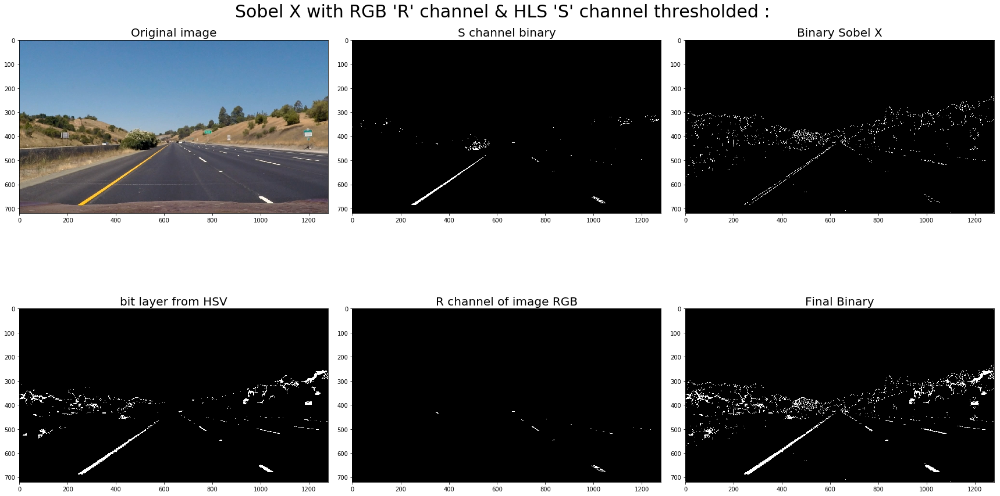

In [46]:
#TESTING

tstimage = cv2.imread('.\\test_images\\straight_lines1.jpg')
#tstimage = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

result = processimage(tstimage, (220, 255), sx_thresh=(40, 70))


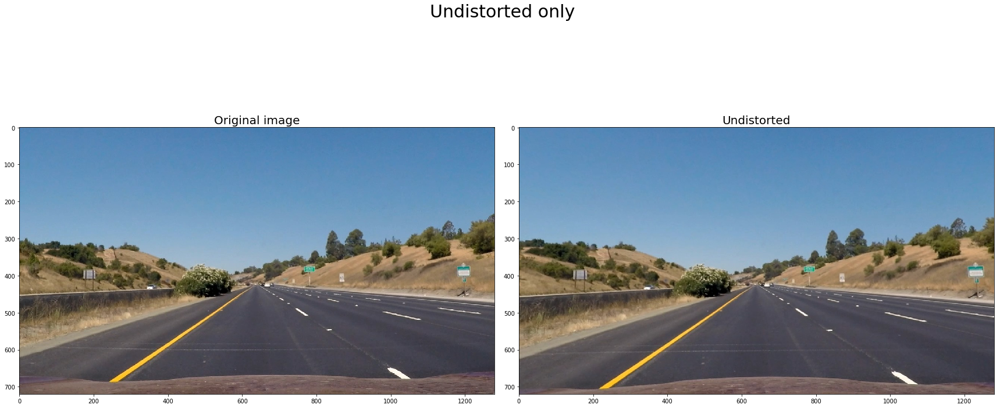

In [5]:
#TESTING

tstimage = cv2.imread('.\\test_images\\straight_lines1.jpg')
tstimage = cv2.cvtColor(tstimage, cv2.COLOR_BGR2RGB)

uimage = cv2.undistort(tstimage, mtx, dist, None, mtx)

f, ((ax1,ax2)) = plt.subplots(1, 2, figsize=(24, 13))
f.tight_layout()
f.suptitle("Undistorted only", fontsize=30)

ax1.imshow(tstimage)
ax1.set_title('Original image', fontsize=20)

ax2.imshow(uimage)
ax2.set_title('Undistorted', fontsize=20)

In [6]:
##NOT IN USE; was used to try and reduce the mi-identification of lane lines in car door reflections.
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    #print(img.shape)
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, np.int_(vertices), ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


In [59]:
##Perspective Transform

import matplotlib.patches as patches
#pipeline to read in images and save out the final result (pipeline test!!!!!!!)
def warpperspective(imagein):   
    #image = processimage(imagein, (170, 255), sx_thresh=(20, 100))
    image = imagein
    gray = np.copy(image) #copy original image to instance "gray"
    
    #gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) #convert to greyscale (error??)
    #print(gray.shape)
    #cv2.imwrite("output_images/problemImagegray.jpg",gray) #output the image to local file

    #gray = gaussian_blur(gray, 9) #blur out some of the noise
    #gray = canny(gray, 20, 70) #Canny edge detection to simplify finding edges
    
    #cv2.imwrite("output_images/problemImagecanny.jpg",gray) #output the image to local file
    
    src_vertices = np.float32(
        [[200, image.shape[0]],
        [575, int(image.shape[0]*.64)],         
        [702, int(image.shape[0]*.64)], 
        [1110,  image.shape[0]]])
    
    dst_vertices = np.float32(
        [[400, 720],
        [400, 0], 
        [900, 0], 
        [900, 720]])
    
    #masked_vertices = np.float32(
    #    [( int(image.shape[0]),int(180)),
    #    ( int((image.shape[0]*.64)-10),555),         
    #    ( int((image.shape[0]*.64)-10), 722), 
    #    (image.shape[0],1130)])
    
    #print(masked_vertices)

    #vertices = np.array(masked_vertices, dtype=np.int32) #build vert list per 15: quiz
    #masked_image = region_of_interest(image, vertices) #define region of interest to apply lines to 
    
    #weighted_image = weighted_img(line_image, image, α=0.8, β=1., λ=0.)

    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src_vertices, dst_vertices)
    Minv = cv2.getPerspectiveTransform(dst_vertices, src_vertices)
    # use cv2.warpPerspective() to warp your image to a top-down view
    topdown = cv2.warpPerspective(image, M, (image.shape[1],image.shape[0]), flags=cv2.INTER_LINEAR)
    if 1==0:
        f, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))
        f.tight_layout()
        f.suptitle("Warp Image:", fontsize=20)
        ax1.imshow(image, cmap='gray')
        ax1.plot(src_vertices[0][0],src_vertices[0][1],'.')
        ax1.plot(src_vertices[1][0],src_vertices[1][1],'.')
        ax1.plot(src_vertices[2][0],src_vertices[2][1],'.')
        ax1.plot(src_vertices[3][0],src_vertices[3][1],'.')
        ax1.add_patch(patches.Polygon(src_vertices, linewidth=2, edgecolor='r', facecolor='none'))
        ax1.set_title('Desired Area', fontsize=20)
        ax2.imshow(topdown, cmap='gray')
        ax2.add_patch(patches.Polygon(dst_vertices, linewidth=2, edgecolor='r', facecolor='none'))
        ax2.set_title('Warped image', fontsize=20)
    
    return topdown,  Minv 


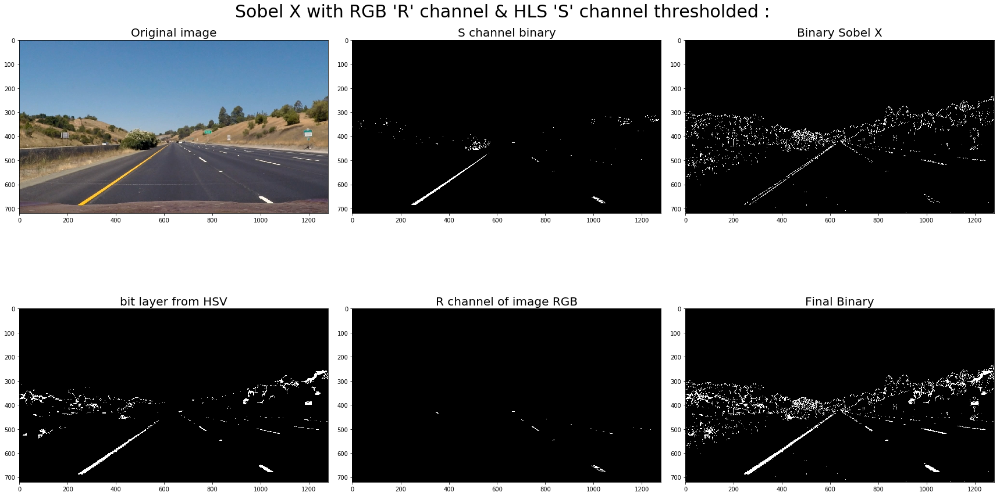

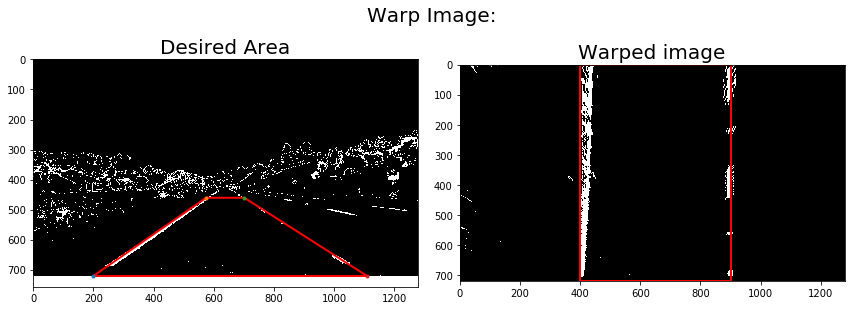

In [49]:
#Test perspective warping on a straight line section of road.

result, resultMinv = warpperspective(processimage(cv2.imread('.\\test_images\\straight_lines1.jpg')))#, (170, 255), sx_thresh=(30, 70)))

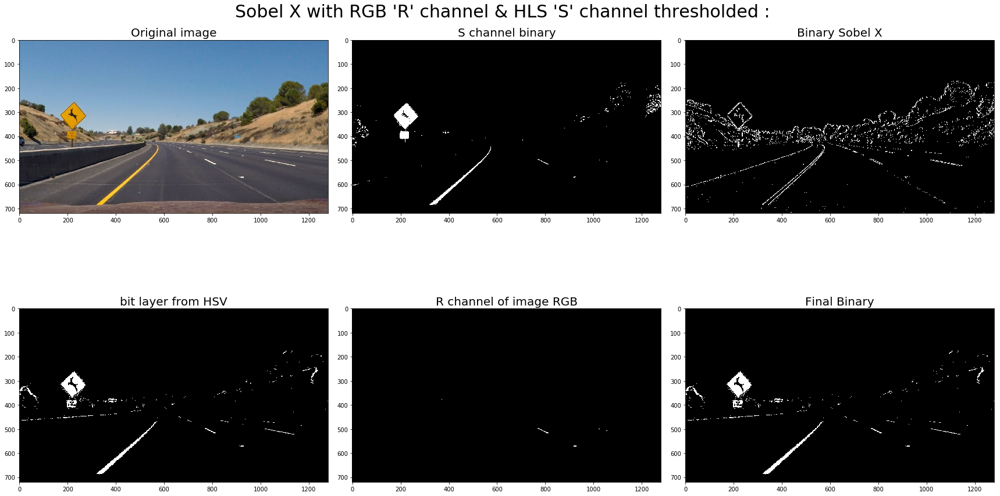

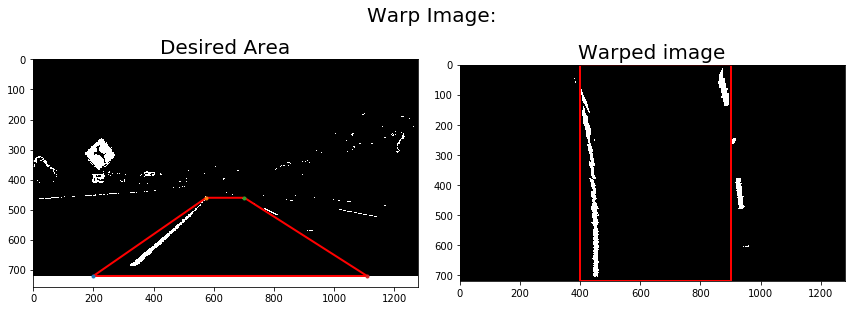

In [9]:
#test with curved lines

curved_image = cv2.imread('.\\test_images\\test2.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)

procimg = processimage(curved_image)#, (170, 255), sx_thresh=(30, 100))

curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)

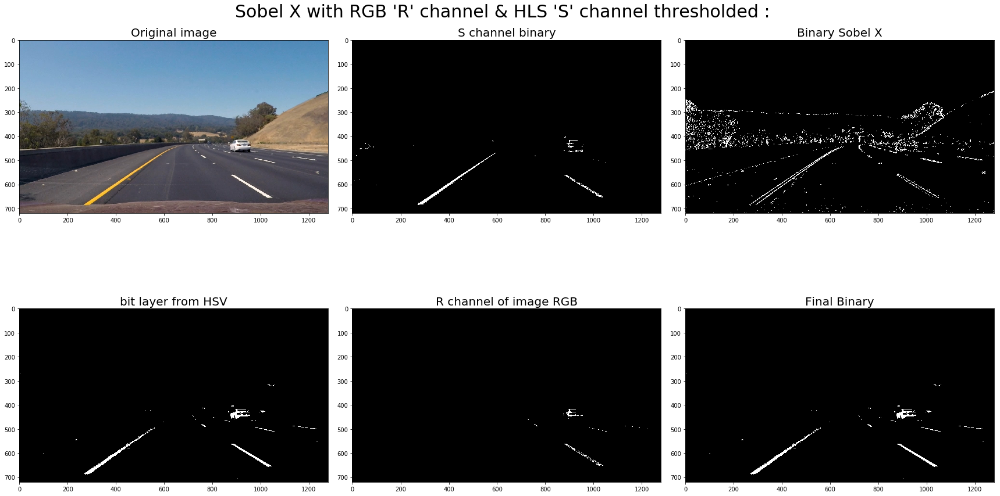

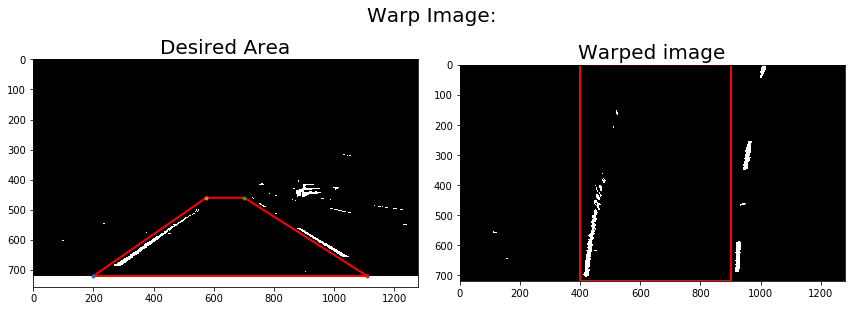

In [10]:
#test on another curved line image
curved_image = cv2.imread('.\\test_images\\test3.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)

procimg = processimage(curved_image)#, (220, 240), sx_thresh=(30, 70))

curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)

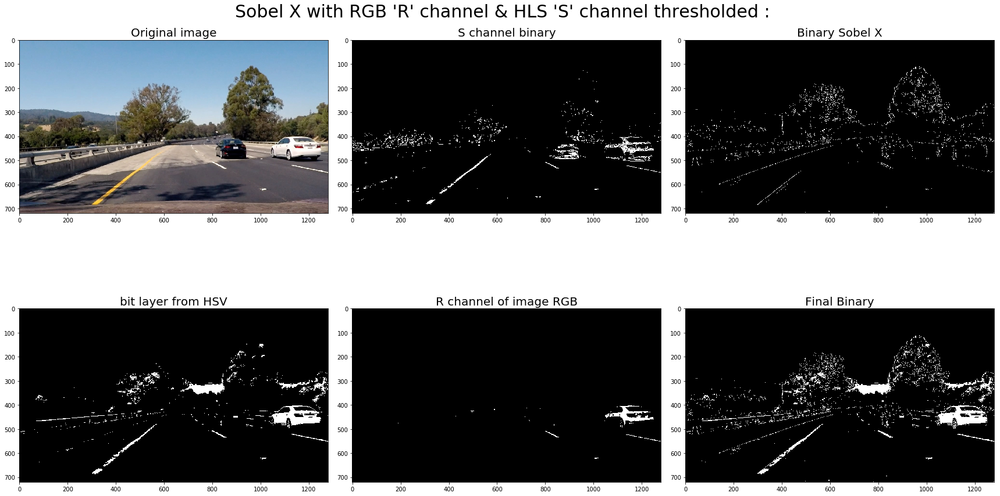

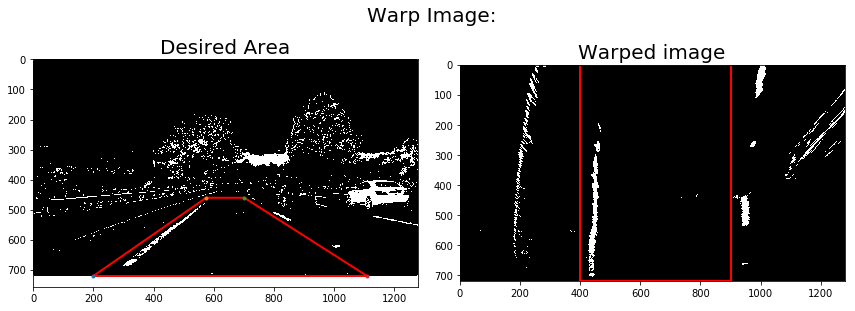

In [51]:
#test on next image
curved_image = cv2.imread('.\\test_images\\test4.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)

procimg = processimage(curved_image, (200, 255), sx_thresh=(40, 70))
curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)

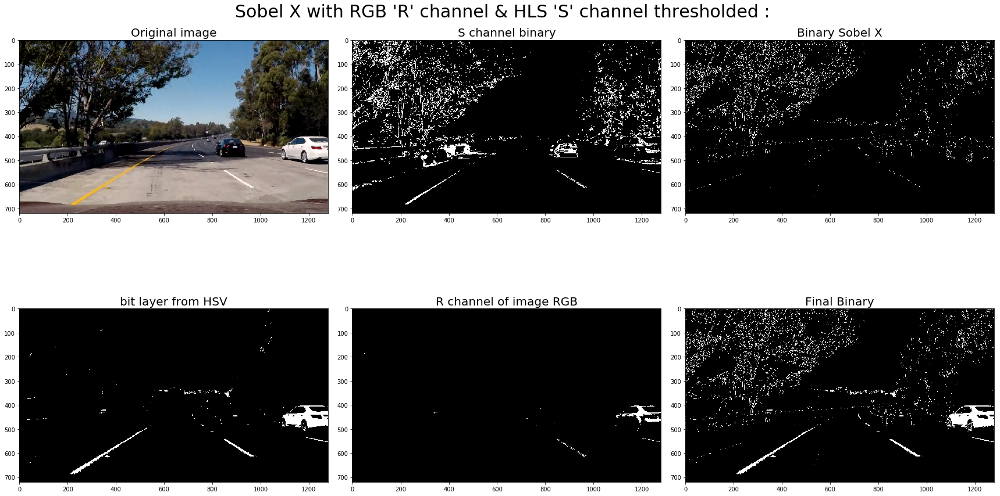

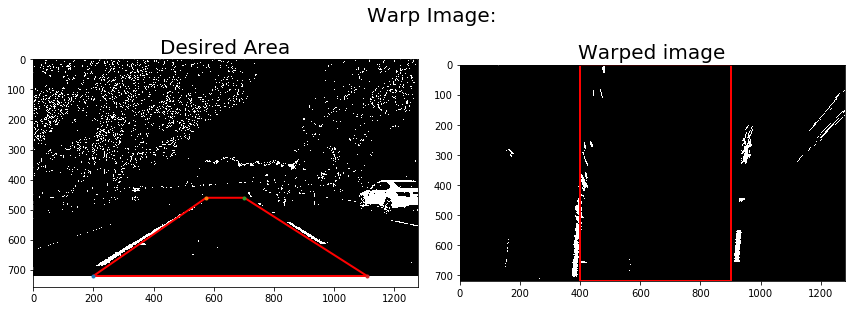

In [52]:
#test bright day test
curved_image = cv2.imread('.\\test_images\\test5.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)

procimg = processimage(curved_image, (200, 250), sx_thresh=(40, 70))

curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)

In [53]:
##find the lanes Sliding window search
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[
        int(img_ref.shape[0]-(level+1)*height):
        int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):
        min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 

    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def slidingwindowsearch1(warped, window_width=50,window_height=80,margin = 100, do_plot=False):
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    # If we found any window centers
    if len(window_centroids) > 0:
    
        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)
    
        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
    
        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
     
    # If no window centers found, just display orginal road image
    else:
        output = warped#np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    if do_plot:
        # Display the final results
        plt.imshow(output, cmap='gray')
        plt.title('results')
        plt.show()
    return output

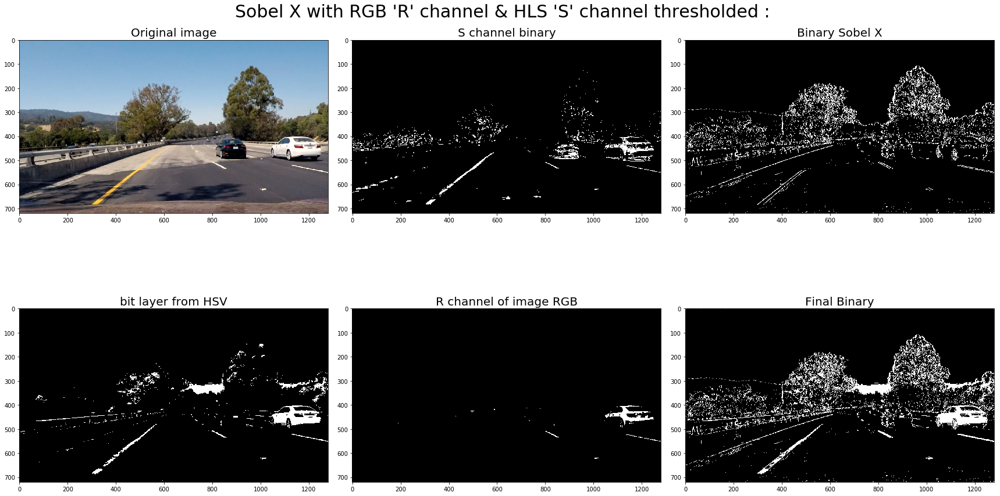

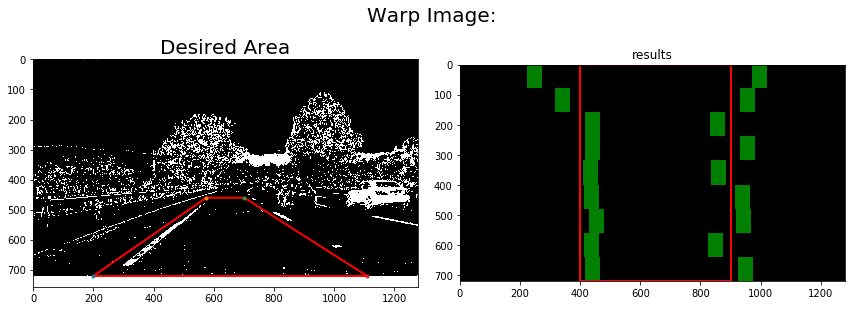

In [54]:
##Find the lines with initial version of sliding window search

#for imagename in os.listdir(".\\test_images\\"):
#    imagein=mpimg.imread(".\\test_images\\"+imagename) #read in the image
curved_image = cv2.imread('.\\test_images\\test4.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)

procimg = processimage(curved_image, (170, 255), sx_thresh=(20, 100))

curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)
#print(curved_warped_img.shape)
result = slidingwindowsearch1(curved_warped_img, do_plot=True)

In [15]:
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None


In [37]:
##use second version of sliding window from lectures
def slidingwindowsearch(binary_warped,do_plot=True):
    global left_fitx_hist, right_fitx_hist
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    
    #if leftx_old==None:
    #    leftx_old=[]
    #    leftx_old.append(leftx[0:450])
    #else:
    #    if len(leftx_old)>10:
    #        leftx_old=leftx_old[1:]
    #    leftx_old.append(leftx[0:450])
    #if rightx_old==None:
    #    rightx_old=[]
    #    rightx_old.append(rightx[0:450])
    #else:
    #    if len(rightx_old)>10:
    #        rightx_old=rightx_old[1:]
    #    rightx_old.append(rightx[0:450])
    
    lefty = nonzeroy[left_lane_inds] 
    righty = nonzeroy[right_lane_inds] 
    
    #if lefty_old==None:
    #    lefty_old=[]
    #    lefty_old.append(lefty[0:450])
    #else:
    #    if len(lefty_old)>10:
    #        lefty_old=lefty_old[1:]
    #    lefty_old.append(lefty[0:450])
    #if righty_old==None:
    #    righty_old=[]
    #    righty_old.append(righty[0:450])
    #else:
    #    if len(righty_old)>10:
    #        righty_old=righty_old[1:]
    #    righty_old.append(righty[0:450])
        
    #print((np.array(leftx_old[0]).shape))
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    #Fit the polynomials to the averaged lines
    #left_fit = np.polyfit(np.mean( np.array(lefty_old), axis=0 ), np.mean( np.array(leftx_old), axis=0 ), 2)
    #right_fit = np.polyfit(np.mean( np.array(righty_old), axis=0 ), np.mean( np.array(rightx_old), axis=0 ), 2)
    

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    #CEL 5/3/17: Build left fit history in order to identify outliers
    if left_fitx_hist==None:
        left_fitx_hist=[]
        left_fitx_hist.append(left_fitx)
    else:
        if abs((np.mean(np.mean(np.array(left_fitx_hist), axis=0 ))) - np.mean(left_fitx))<50:
            if len(left_fitx_hist)>10:
                left_fitx_hist=left_fitx_hist[1:]
            left_fitx_hist.append(left_fitx)
            #print(abs(np.mean(left_fitx)-np.mean(np.mean(np.array(left_fitx_hist), axis=0 ))))
            
    #CEL 5/3/17: Build right fit history in order to identify outliers
    if right_fitx_hist==None:
        right_fitx_hist=[]
        right_fitx_hist.append(right_fitx)
    else:
        if abs((np.mean(np.mean(np.array(right_fitx_hist), axis=0 ))) - np.mean(right_fitx))<50:
            if len(right_fitx_hist)>10:
                right_fitx_hist=right_fitx_hist[1:]
            right_fitx_hist.append(right_fitx)
            #print(abs(np.mean(right_fitx)-np.mean(np.mean(np.array(right_fitx_hist), axis=0 ))))
    
    #print(left_fitx[0], right_fitx[2])
    #print(np.mean( np.array(left_fitx_hist), axis=0 ),np.mean( np.array(right_fitx_hist), axis=0 ))
    
    left_fitx_mean = np.mean(np.array(left_fitx_hist), axis=0 )[:len(ploty)]
    right_fitx_mean = np.mean(np.array(right_fitx_hist), axis=0 )[:len(ploty)]

    #print(left_fitx_mean.shape,right_fitx_mean.shape,ploty.shape)
    
    if(do_plot):
        
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
    
    #print("left_fitx:",left_fitx, ", right_fitx:",right_fitx,", ploty:", ploty)
    return left_fitx_mean, right_fitx_mean , ploty
    #return left_fitx, right_fitx, ploty

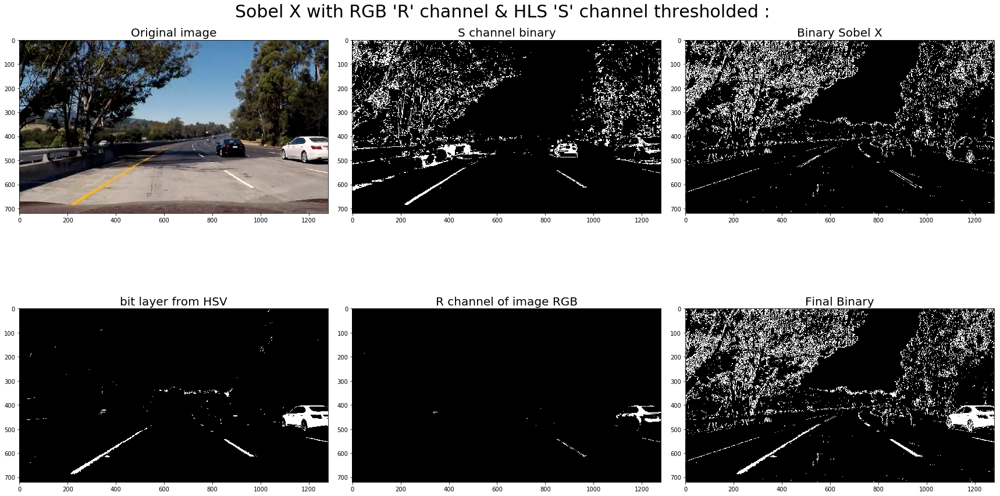

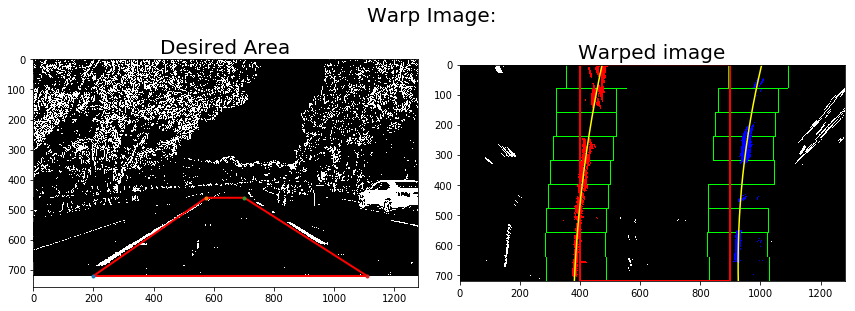

In [55]:
##Find the lines with second version of sliding window search
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None
#for imagename in os.listdir(".\\test_images\\"):
#    imagein=mpimg.imread(".\\test_images\\"+imagename) #read in the image
curved_image = cv2.imread('.\\test_images\\test5.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)


procimg = processimage(curved_image, (170, 255), sx_thresh=(20, 100))

curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)

curved_warped_img_leftx, curved_warped_img_rightx, ploty = slidingwindowsearch(curved_warped_img,do_plot=True)


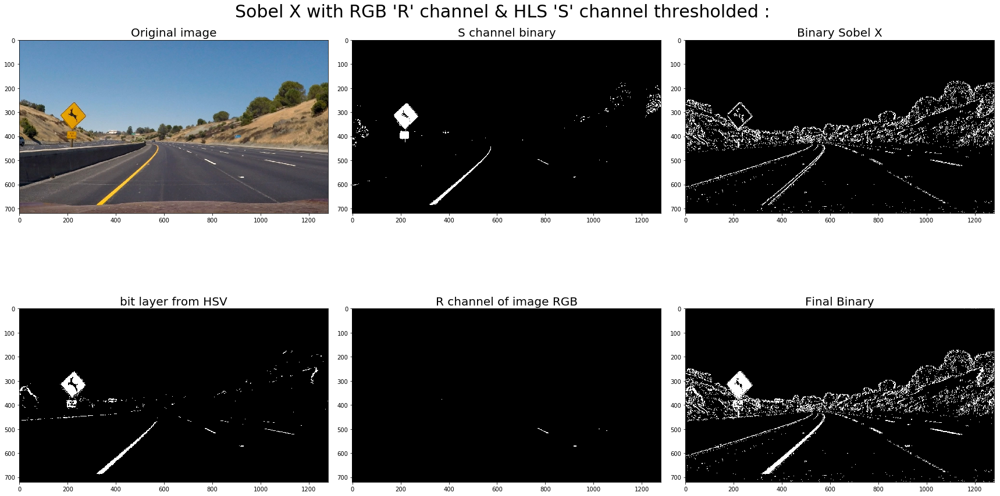

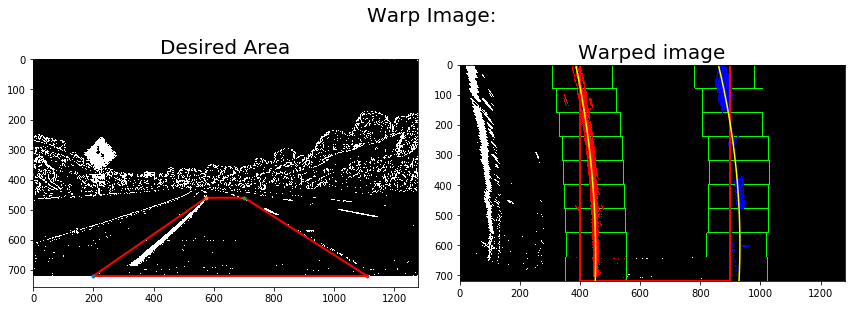

In [56]:
##Find the lines with second version of sliding window search
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None
#for imagename in os.listdir(".\\test_images\\"):
#    imagein=mpimg.imread(".\\test_images\\"+imagename) #read in the image
curved_image = cv2.imread('.\\test_images\\test2.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)


procimg = processimage(curved_image, (170, 255), sx_thresh=(20, 100))

curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)

curved_warped_img_leftx, curved_warped_img_rightx, ploty = slidingwindowsearch(curved_warped_img,do_plot=True)


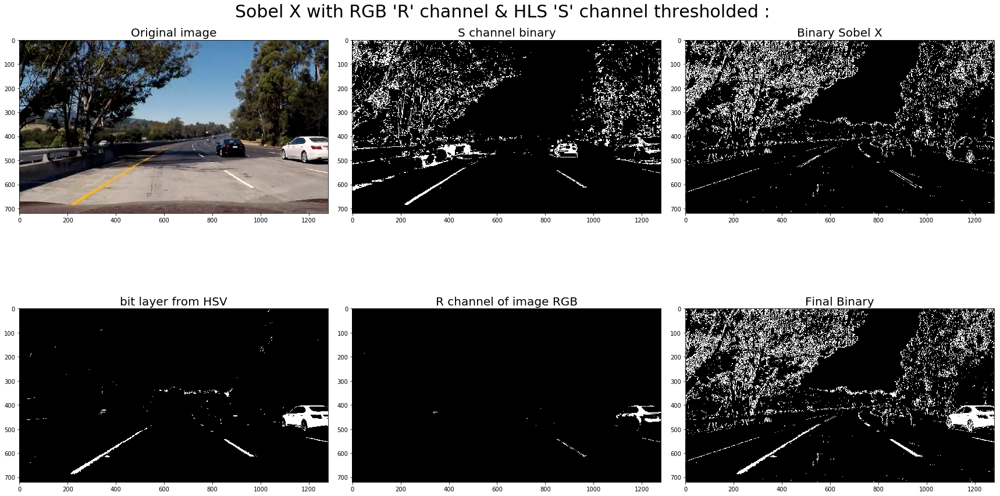

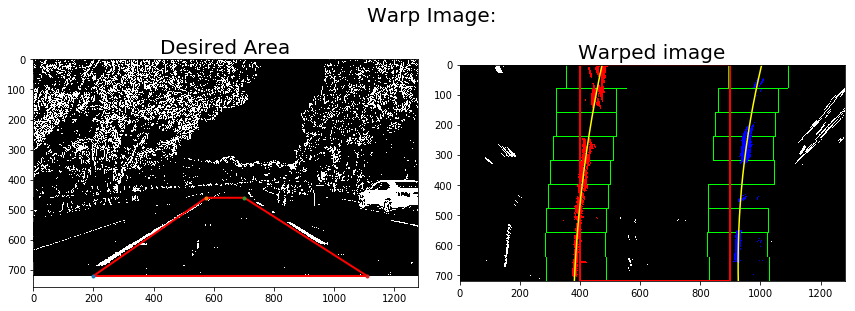

In [57]:
##Find the lines with second version of sliding window search
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None
#for imagename in os.listdir(".\\test_images\\"):
#    imagein=mpimg.imread(".\\test_images\\"+imagename) #read in the image
curved_image = cv2.imread('.\\test_images\\test5.jpg')
#curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)


procimg = processimage(curved_image, (170, 255), sx_thresh=(20, 100))

curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)

curved_warped_img_leftx, curved_warped_img_rightx, ploty = slidingwindowsearch(curved_warped_img,do_plot=True)


In [ ]:
##find curvature

In [20]:
def find_curvature(leftx,rightx,ploty):
    
    #ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    y_eval = np.max(ploty)
    
    ym_per_pix = 30/720 
    xm_per_pix = 3.7/700 
    
    # Fit polynomials to real world ratios
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the curvature
    left_curve = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curve = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Radius of curvature in meters
    return left_curve, right_curve

def position_to_center(leftx, rightx, img_width):
    center = img_width/2
    lane_mid_point = leftx + ((rightx - leftx)/2)
    result = (center - lane_mid_point)
    result = result * (3.7 / 700) #meters per pixel
    return result

def translate_position_to_center(res):
    res = abs(res)
    result = '0m'
    if res < 0:
        result = "{0:.2f}".format(res)+"m right of center"
    elif res > 0:
        result = "{0:.2f}".format(res)+"m left of center"
        
    return result

In [ ]:
##draw the final image

In [21]:
def drawlane(undist_img, binary_img, left_fit, right_fit, ploty, unwarp_Minv, do_plot=False):
    
    global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction

    #Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fit, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fit, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    #CEL 5/1/2017 added code to check polygon shape to handle outlier error predictions as suggested in review
    if (polygon_points_old == None):
        polygon_points_old = pts

    a = (polygon_points_old[:,:,0]).astype('uint8')
    b = (pts[:,:,0]).astype('uint8')
    
    ret = cv2.matchShapes(a,b,1,0.0)
    
    #print("matchshape:",ret)

    if (ret < 5):
        # Use the new polygon points to write the next frame due to similarities of last successfully written polygon area
        polygon_points_old = pts
        valid_prediction = "Y"
    else: 
        pts = polygon_points_old
        valid_prediction = "N"
    #CEL 5/12/2017 end new code to handle bad lane shape

    # Draw the lane 
    cv2.fillPoly(binary_img, np.int_([pts]), (0,255, 0))
    # Unwarp lane image inverse perspective matrix (Minv)
    unwarp = cv2.warpPerspective(binary_img, unwarp_Minv, (undist_img.shape[1], undist_img.shape[0])) 
    unwarp = unwarp.astype(np.uint8)
    final_result = cv2.addWeighted(undist_img, 1, unwarp, 0.3, 0)
    # overlay the lane on the original lane image
    if do_plot:
        f, (ax1,ax2) = plt.subplots(1,2)
        ax1.imshow(undist_img)
        ax1.set_title("Original", fontsize=20)
        ax2.imshow(unwarp)
        ax2.set_title("Lane", fontsize=20)
        plt.show()
    return final_result

def write_curv_pos(image_with_lane, left_curv, right_curv, midpoint_pos, do_plot=False):
    less_curve_val = min(left_curv, right_curv)
    
    image_with_lane = cv2.putText(image_with_lane,"curvature = "+"{0:.2f}".format(less_curve_val)+"m",(25,40), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255,255,255), 2, cv2.LINE_AA)
    image_with_lane = cv2.putText(image_with_lane,"position  = "+translate_position_to_center(midpoint_pos),(25,80), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255,255,255), 2, cv2.LINE_AA)                
    if do_plot:
        plt.imshow(image_with_lane)
        plt.show()
    return image_with_lane

In [22]:
##execute the above functions to test
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None
curved_image = cv2.cvtColor(curved_image, cv2.COLOR_BGR2RGB)

In [23]:
curved_warped_img_left_curve, curved_warped_img_right_curve = find_curvature(curved_warped_img_leftx, curved_warped_img_rightx, ploty)

In [24]:
img_pos = position_to_center(curved_warped_img_leftx[-1], curved_warped_img_rightx[-1], 1280)
curved_warped_img_pos = position_to_center(curved_warped_img_leftx[-1], curved_warped_img_rightx[-1], 1280)

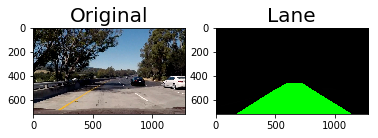

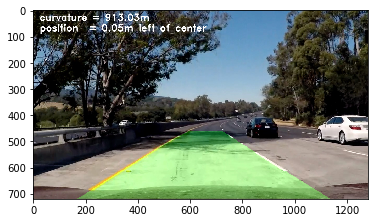

In [25]:
final_result = drawlane(curved_image, np.dstack(( procimg, procimg, procimg)), curved_warped_img_leftx, curved_warped_img_rightx, ploty, curved_warped_img_Minv, do_plot=True)
final_image = write_curv_pos(final_result, curved_warped_img_left_curve, curved_warped_img_right_curve,curved_warped_img_pos, do_plot=True)

In [40]:
##Organize the above into a single function
def find_lane(image):
    
    global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction, num_skips
    #convert image to RGB
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    #undistort image
    uimage = cv2.undistort(image, mtx, dist, None, mtx)
    #create binary version highlighting lines based on R and S channels
    procimg = processimage(uimage, (220, 240), sx_thresh=(30, 70))  
    #unwarp the image
    curved_warped_img, curved_warped_img_Minv =  warpperspective(procimg)
    #Find lane lines
    left_lane_line, right_lane_line, ploty = slidingwindowsearch(curved_warped_img, do_plot=False)
    
    #find left and right curvature
    left_lane_curve, right_lane_curve = find_curvature(left_lane_line, right_lane_line, ploty)
    #Lane midpoint
    lane_center = position_to_center(left_lane_line[-1], right_lane_line[-1], image.shape[1])
    #combine lane and original images
    unwarped_image = drawlane(cv2.cvtColor(uimage, cv2.COLOR_BGR2RGB), np.dstack(( procimg, procimg, procimg)), left_lane_line, right_lane_line, ploty, curved_warped_img_Minv, do_plot=False)

    #if the *_old values have not yet been set, set them.
    #if  left_lane_curve_old == None:
    #    left_lane_curve_old = left_lane_curve
    #if right_lane_curve_old == None:
    #    right_lane_curve_old = right_lane_curve
    #if lane_center_old == None:
    #    lane_center_old = lane_center

    #if ((valid_prediction=="Y") | (num_skips>=5)):
    #    left_lane_curve_old = left_lane_curve
    #    right_lane_curve_old = right_lane_curve
    #    lane_center_old = lane_center
    #    num_skips=0
    #else:
    #    left_lane_curve = left_lane_curve_old
    #    right_lane_curve = right_lane_curve_old
    #    lane_center = lane_center_old
    #    num_skips=num_skips+1
    
    #show curve and position on image
    result_image = write_curv_pos(unwarped_image, left_lane_curve, right_lane_curve, lane_center, do_plot=False)
    
    return result_image

In [27]:
global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction
polygon_points_old = None
left_lane_curve_old = None
right_lane_curve_old = None
lane_center_old = None
valid_prediction = "Y"
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None


C:\Users\Chris\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


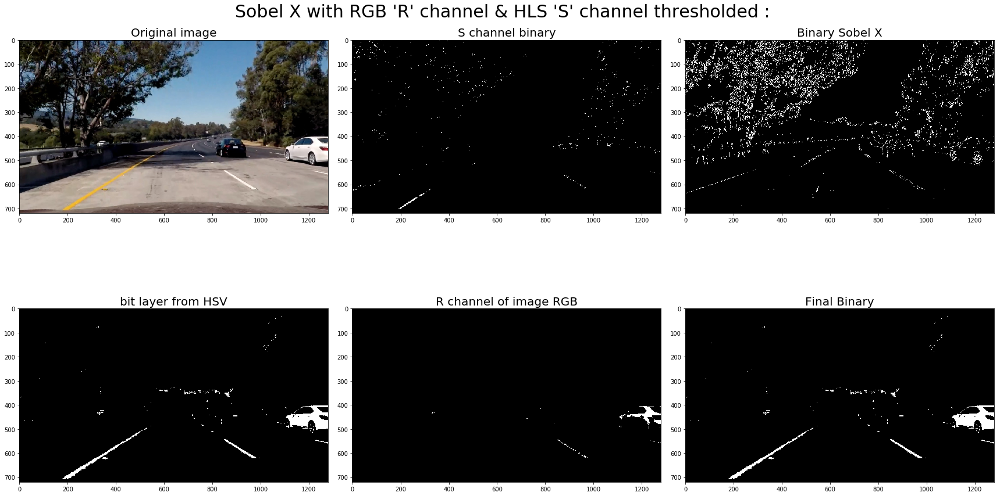

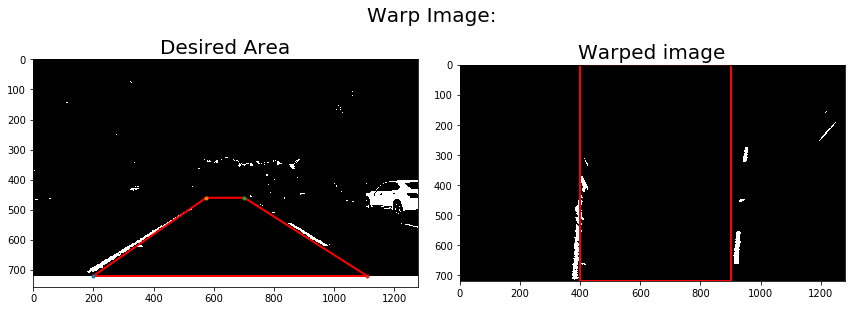

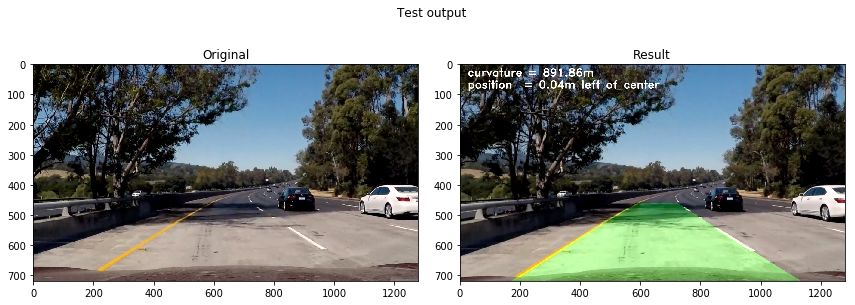

In [28]:
#test
curved_image5 =cv2.imread('.\\test_images\\test5.jpg')# cv2.cvtColor(cv2.imread('.\\test_images\\test5.jpg'),cv2.COLOR_BGR2RGB)
curved_image5_result = find_lane(curved_image5)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
plt.suptitle("Test output")
ax1.imshow(cv2.cvtColor(curved_image5,cv2.COLOR_BGR2RGB))
ax1.set_title("Original")
ax2.imshow(curved_image5_result)
ax2.set_title("Result")
plt.show()

C:\Users\Chris\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


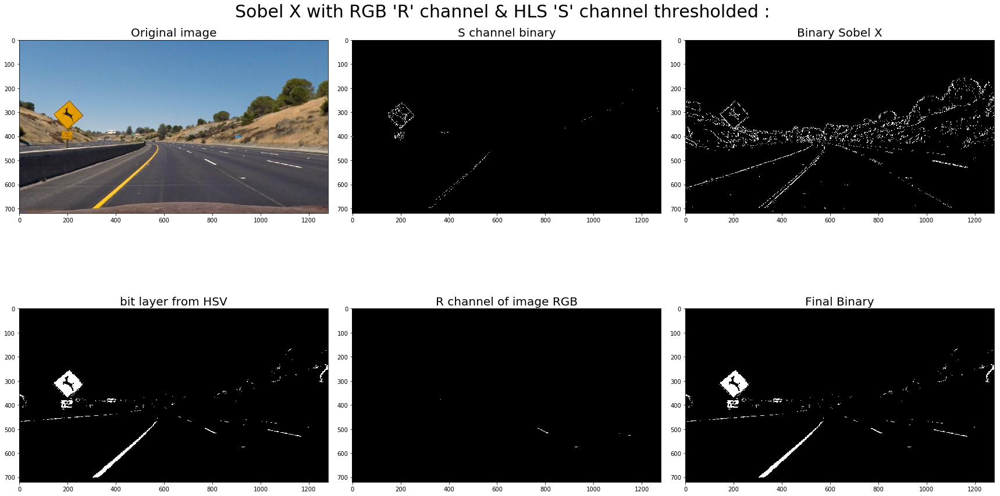

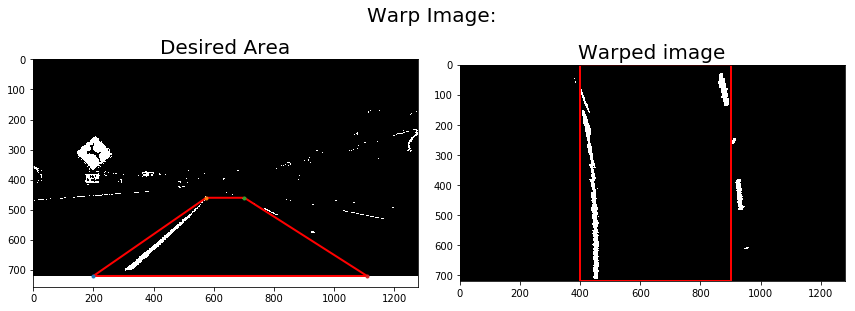

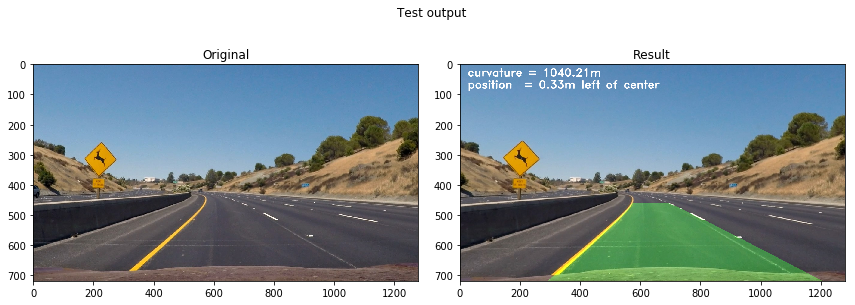

In [29]:
#test2
global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction
polygon_points_old = None
left_lane_curve_old = None
right_lane_curve_old = None
lane_center_old = None
valid_prediction = "Y"
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None


curved_image2 = cv2.imread('.\\test_images\\test2.jpg')#cv2.cvtColor(cv2.imread('.\\test_images\\test2.jpg'),cv2.COLOR_BGR2RGB)
curved_image2_result = find_lane(curved_image2)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
plt.suptitle("Test output")
ax1.imshow(cv2.cvtColor(curved_image2,cv2.COLOR_BGR2RGB))
ax1.set_title("Original")
ax2.imshow(curved_image2_result)
ax2.set_title("Result")
plt.show()

C:\Users\Chris\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


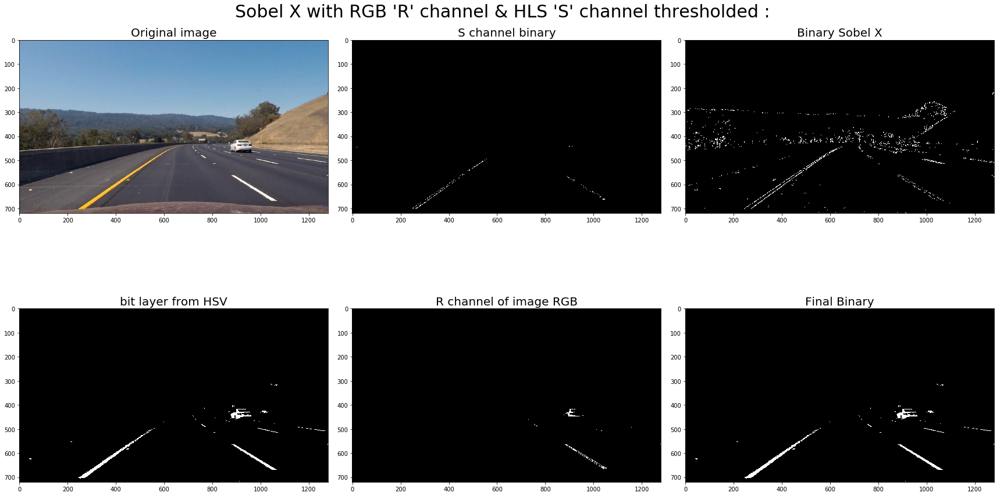

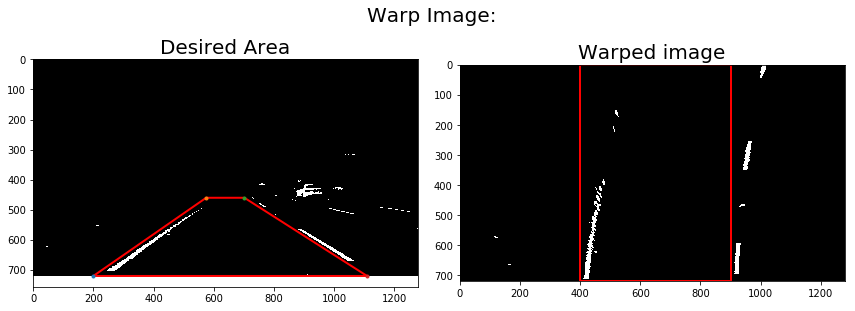

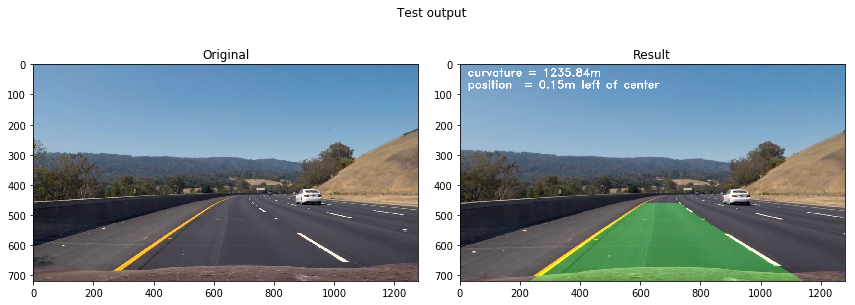

In [30]:
#test3
global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction
polygon_points_old = None
left_lane_curve_old = None
right_lane_curve_old = None
lane_center_old = None
valid_prediction = "Y"
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None

curved_image3 = cv2.imread('.\\test_images\\test3.jpg')
curved_image3_result = find_lane(curved_image3)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
plt.suptitle("Test output")
ax1.imshow(cv2.cvtColor(curved_image3,cv2.COLOR_BGR2RGB))
ax1.set_title("Original")
ax2.imshow(curved_image3_result)
ax2.set_title("Result")
plt.show()

C:\Users\Chris\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


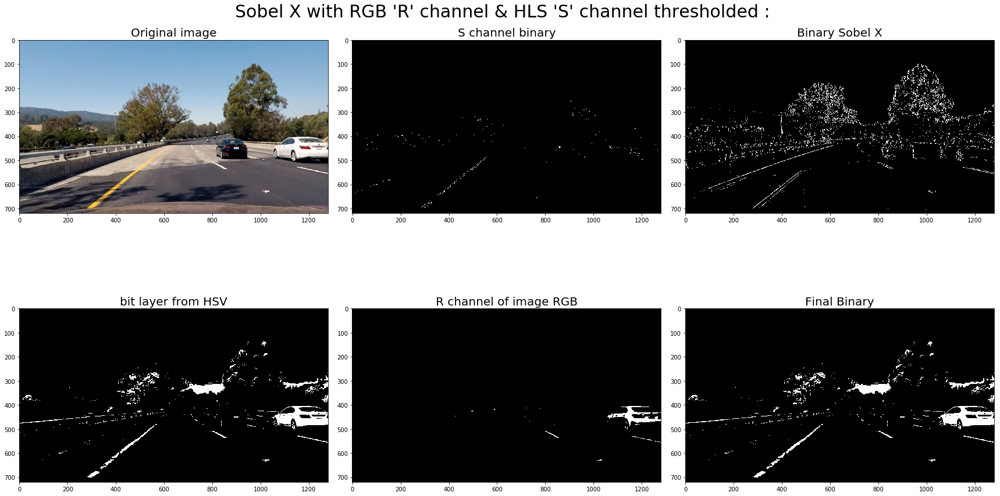

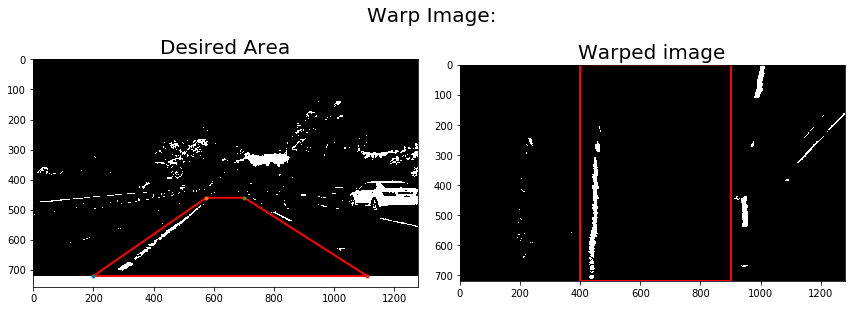

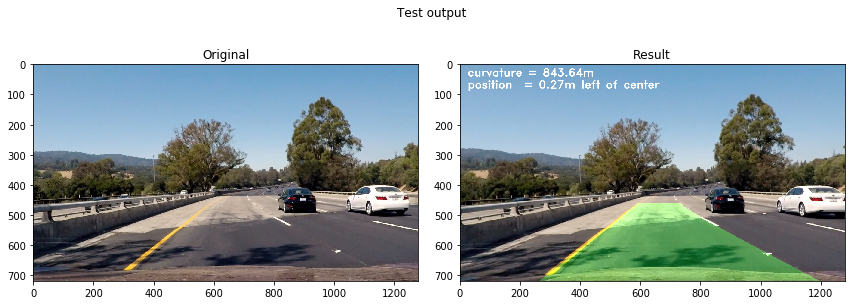

In [31]:
#test4
global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction
polygon_points_old = None
left_lane_curve_old = None
right_lane_curve_old = None
lane_center_old = None
valid_prediction = "Y"
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None

curved_image4 = cv2.imread('.\\test_images\\test4.jpg')
curved_image4_result = find_lane(curved_image4)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
plt.suptitle("Test output")
ax1.imshow(cv2.cvtColor(curved_image4,cv2.COLOR_BGR2RGB))
#ax1.imshow(curved_image4)
ax1.set_title("Original")
ax2.imshow(curved_image4_result)
ax2.set_title("Result")
plt.show()

In [ ]:
##LET'S ROLL THE VIDEO

In [32]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [60]:
global polygon_points_old, left_lane_curve_old, right_lane_curve_old, lane_center_old, valid_prediction, num_skips
polygon_points_old = None
left_lane_curve_old = None
right_lane_curve_old = None
lane_center_old = None
valid_prediction = "Y"
num_skips=0
global left_fitx_hist, right_fitx_hist
left_fitx_hist=None
right_fitx_hist=None


white_output = 'project_video_with_lane.mp4'
clip1 = VideoFileClip(".\\project_video.mp4")
white_clip = clip1.fl_image(find_lane) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_with_lane.mp4
[MoviePy] Writing video project_video_with_lane.mp4


100%|███████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [05:35<00:00,  3.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_with_lane.mp4 

Wall time: 5min 38s


In [36]:
HTML("""
<video width="960" height="540" controls>
  <s  ource src="{0}">
</vi  sdeo>
""".format(white_output))

In [ ]:
challenge_output = 'challenge_video_with_lane.mp4'
clip1 = VideoFileClip(".\\challenge_video.mp4")
challenge_clip = clip1.fl_image(find_lane) #NOTE: this function expects color images!!
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [ ]:
hchallenge_output = 'harder_challenge_video_with_lanes.mp4'
clip2 = VideoFileClip(".\harder_challenge_video.mp4")
hchallenge_clip = clip2.fl_image(find_lane) #NOTE: this function expects color images!!
%time hchallenge_clip.write_videofile(hchallenge_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(hchallenge_output))